In [1]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [2]:
df = pd.read_csv("../data/display_data.csv")
df = df.drop(['category'], axis= 1)

In [4]:
corpus = df['content']

stop_words = 'english'
vectorizer = CountVectorizer(stop_words=stop_words, token_pattern=r'\b\w+\b')
X = vectorizer.fit_transform(corpus)

In [5]:
from sklearn.decomposition import LatentDirichletAllocation
num_topics = 15
lda_model = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda_model.fit(X)

LatentDirichletAllocation(n_components=15, random_state=42)

In [6]:
feature_names = vectorizer.get_feature_names_out()
num_top_words = 10  
topics = {}

for topic_idx, topic in enumerate(lda_model.components_):
    top_words_idx = topic.argsort()[:-num_top_words - 1:-1]
    top_words = [feature_names[i] for i in top_words_idx]
    topics[f"Topic {topic_idx + 1}"] = top_words

df_topics = pd.DataFrame(topics)

In [7]:
df_topics

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15
0,s,stories,s,university,sign,best,2023,said,s,rs,s,ai,new,s,cent
1,space,google,latest,s,s,s,students,s,india,said,said,iit,apple,league,0
2,subscribe,register,film,education,article,awards,2024,advertisement,australia,crore,russian,students,users,said,s
3,mission,facebook,news,students,read,sports,read,india,test,cent,russia,s,register,time,1
4,subscriber,account,updates,learning,buy,2024,candidates,company,cricket,india,advertisement,technology,s,game,advertisement
5,express,email,said,parul,subscriber,golden,exam,government,team,year,olympic,indian,like,club,oil
6,available,continue,actor,management,subscription,read,official,new,t,growth,athletes,university,google,year,points
7,content,free,indian,online,archive,ap,class,companies,world,s,ukraine,institute,app,goal,nifty
8,payments,limit,bollywood,digital,need,globes,sign,report,final,advertisement,sports,research,free,advertisement,bank
9,easy,exhausted,entertainment,industry,india,poster,test,court,said,bank,world,india,pro,1,market


In [8]:
df.loc[:, 'topic'] = lda_model.transform(X).argmax(axis=1) + 1

In [9]:
df

,content,topic
0,DU Admissions 2023: The Delhi University today...,7
1,After winning the bronze medal in the men’s 25...,5
2,Some footballing inevitabilities of the New Ye...,14
3,"Playing his 100th Test, Cheteshwar Pujara on S...",9
4,Reliance Industries chairman Mukesh Ambani ove...,10
...,...,...
9995,The portal – Unclaimed Deposits – Gateway to A...,10
9996,"The higher education regulator, University Gra...",7
9997,Splitting costs with friends or roommates can ...,13
9998,"Direct tax-to-GDP ratio, which reflects the sh...",10


In [10]:
# df.to_csv('../data/LDA_topics.csv', index=False)

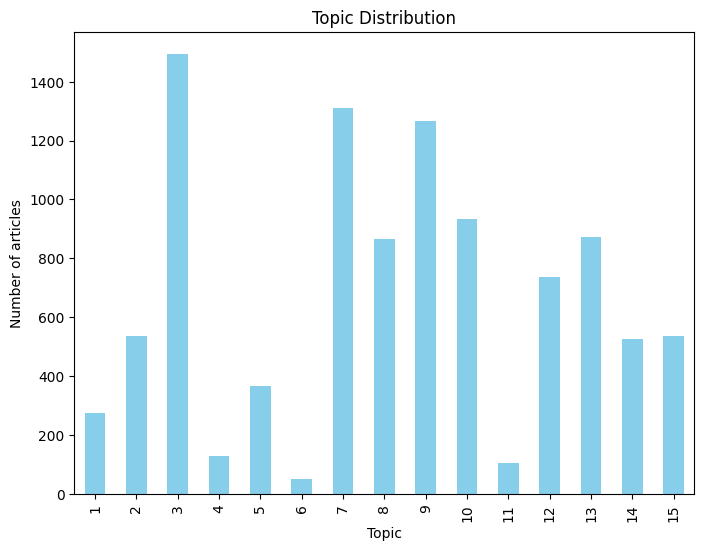

In [11]:
topic_distribution = df['topic'].value_counts().sort_index()
plt.figure(figsize=(8, 6))
topic_distribution.plot(kind='bar', color='skyblue')
plt.title('Topic Distribution')
plt.xlabel('Topic')
plt.ylabel('Number of articles')
plt.show()

In [9]:
topic_14_article = df[df['topic'] == 14]['content']
topic_14_corpus = topic_14_article.values
vectorizer_topic_14 = CountVectorizer(stop_words='english', token_pattern=r'\b\w+\b')
X_topic_14 = vectorizer_topic_14.fit_transform(topic_14_article)

feature_names_topic_14 = vectorizer_topic_14.get_feature_names_out()
top_words_topic_14 = pd.Series(X_topic_14.sum(axis=0).A1, index=feature_names_topic_14)
top_words_topic_14 = top_words_topic_14.sort_values(ascending=False)
top_words_topic_14.head(20)

s                2011
league            741
said              703
time              483
club              439
world             406
cup               399
advertisement     398
year              394
game              386
1                 377
goal              374
team              372
united            343
t                 330
city              321
final             313
manchester        288
season            283
premier           280
dtype: int64

In [10]:
for topic_num in range(1, num_topics + 1):
    print(f"Topic {topic_num}:")
    print(df[df['topic'] == topic_num]['content'].head(10))
    print("\n")

Topic 1:
25     NASA last Friday announced it modified agreeme...
44     Intel is gearing up to ramp up its processors ...
48     Aditya L1, India’s first mission to study the ...
104    You can easily get online and choose a tablet ...
119    The small Spanish town of Almendralejo was sha...
127    A video of Bollywood star Anil Kapoor donning ...
149    Russia reported an “abnormal situation” Saturd...
171    Cooperative NCCF on Wednesday said about 5 ton...
187    The Meta Quest 3 is finally here after teasing...
189    Remember a screenshot of the tweet widely shar...
Name: content, dtype: object


Topic 2:
7      Imagine a massive auditorium where thousands o...
9      An arching parabola of a floated return from A...
22     ChatGPT has emerged as the undisputed winner w...
34     The action-drama Salaar, starring Prabhas and ...
39     When Apple dropped the first iPhone on the tec...
80     Since Friday last week, we’ve seen perhaps the...
82     Prabhas Movie Salaar, Day 3 Box 

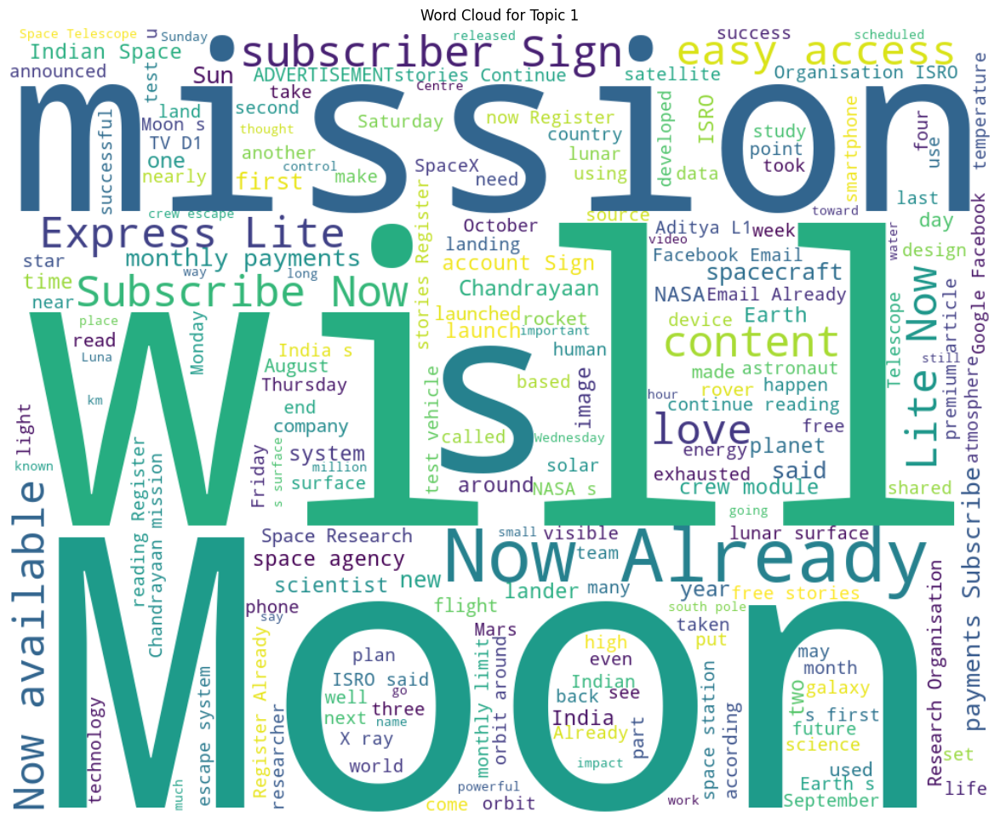

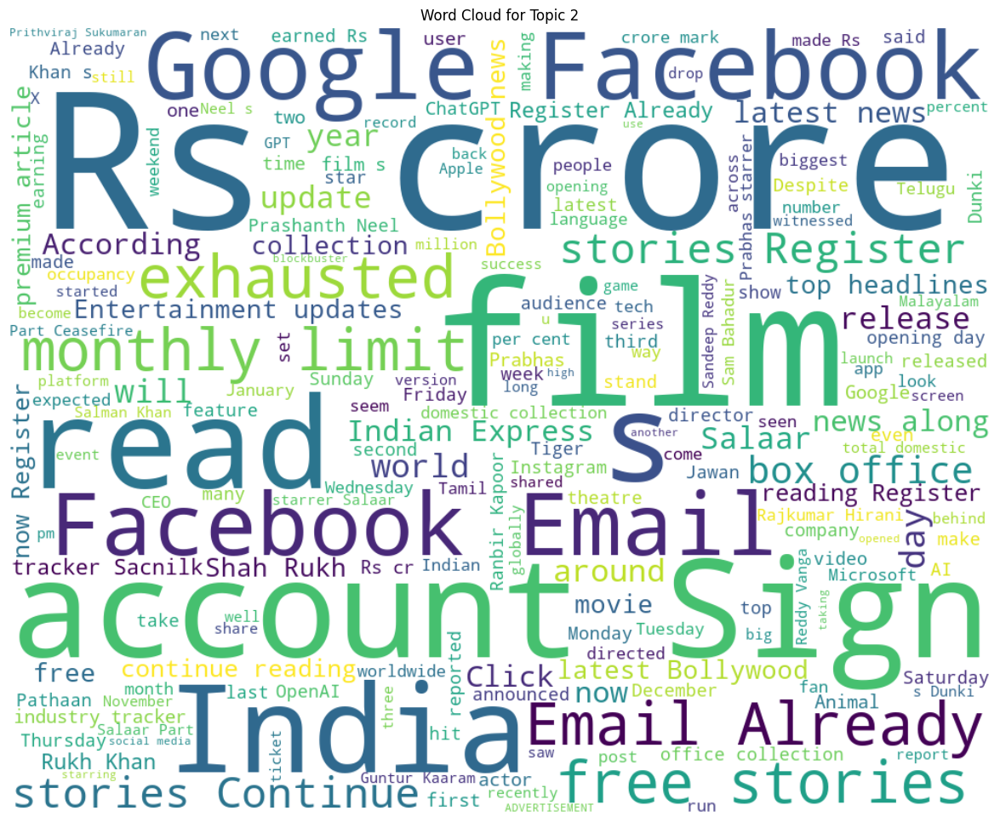

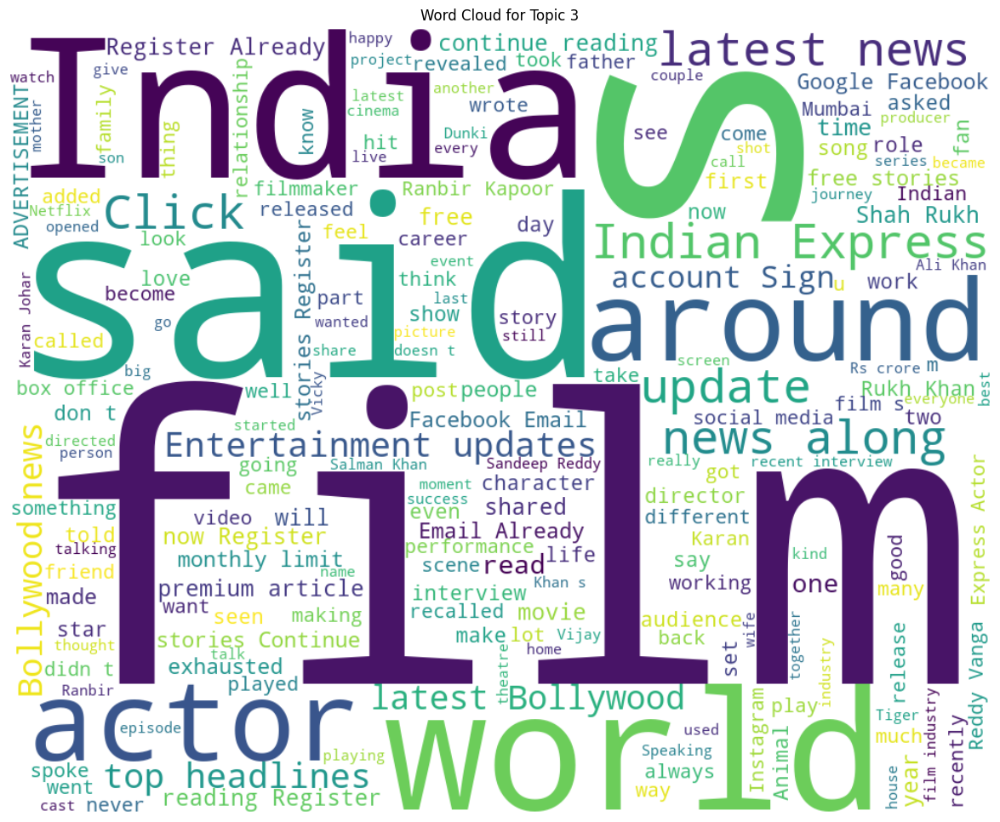

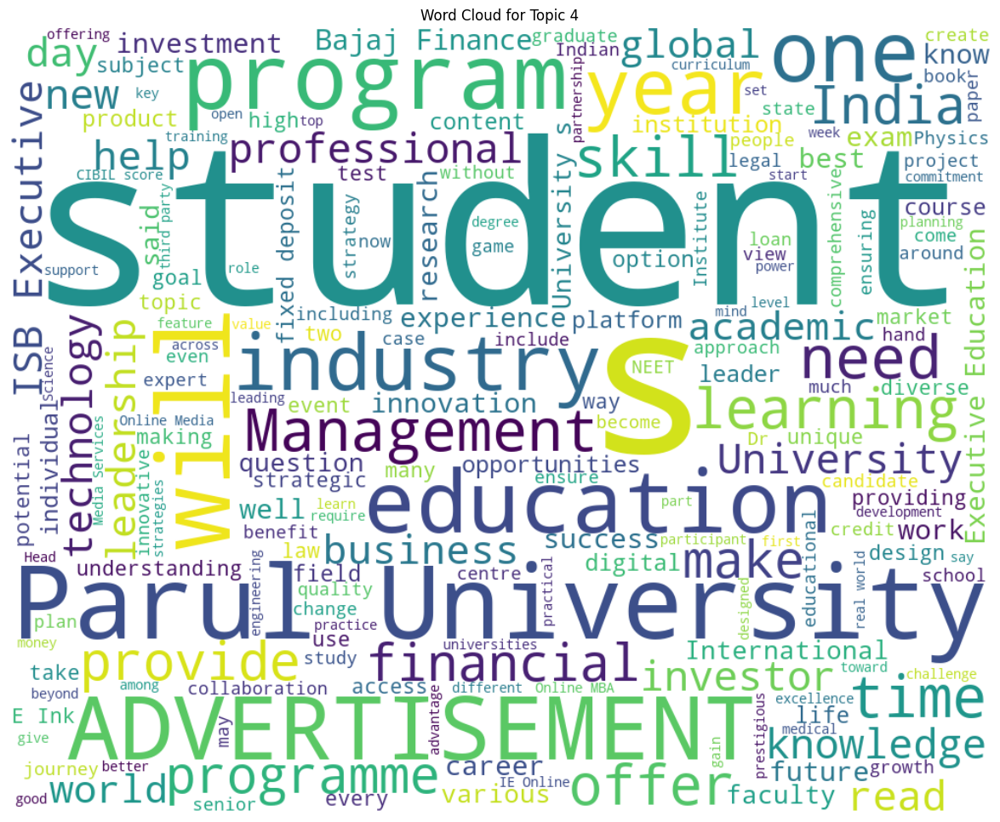

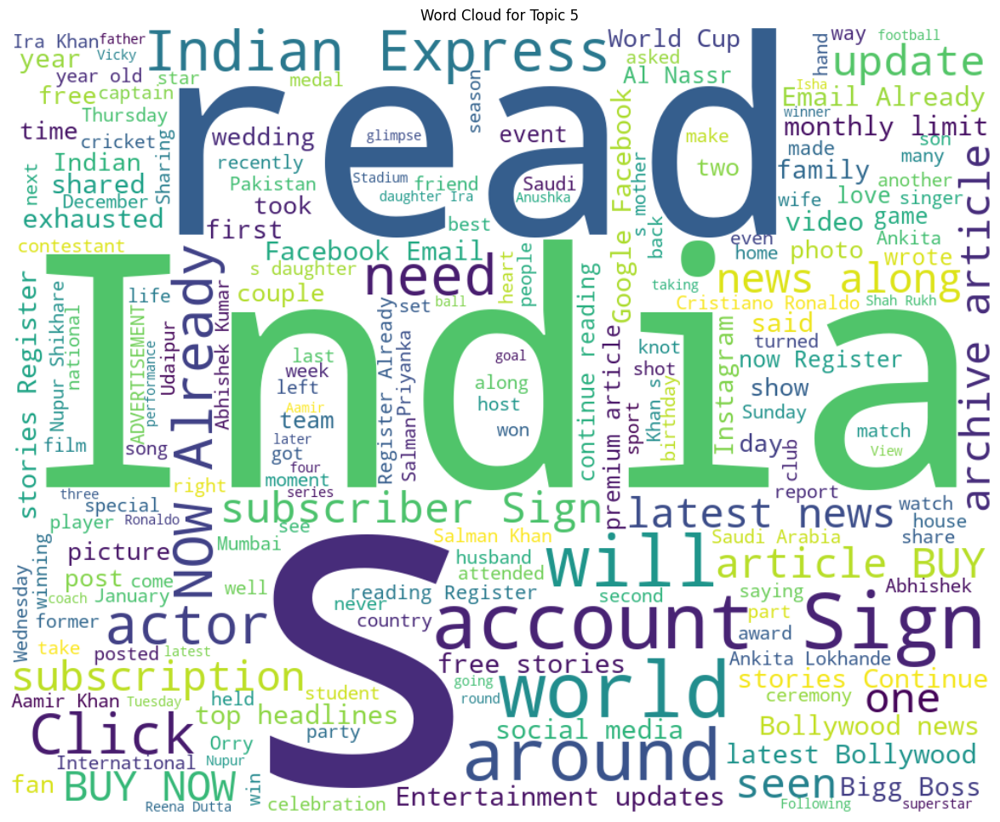

...

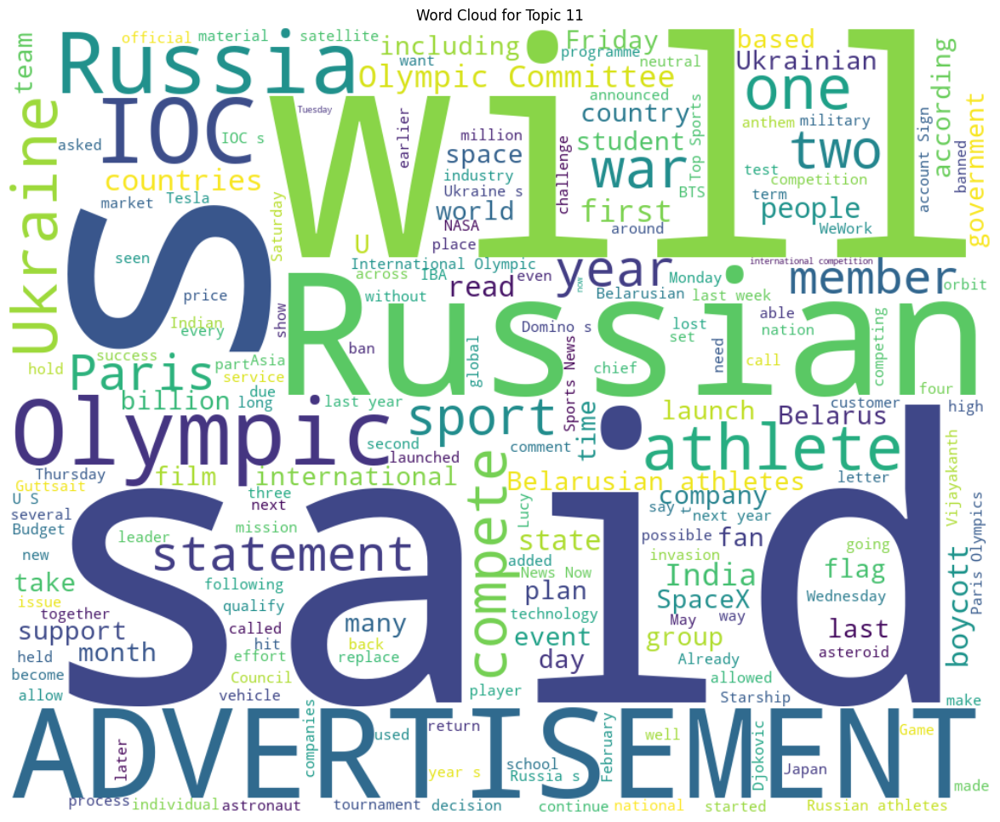

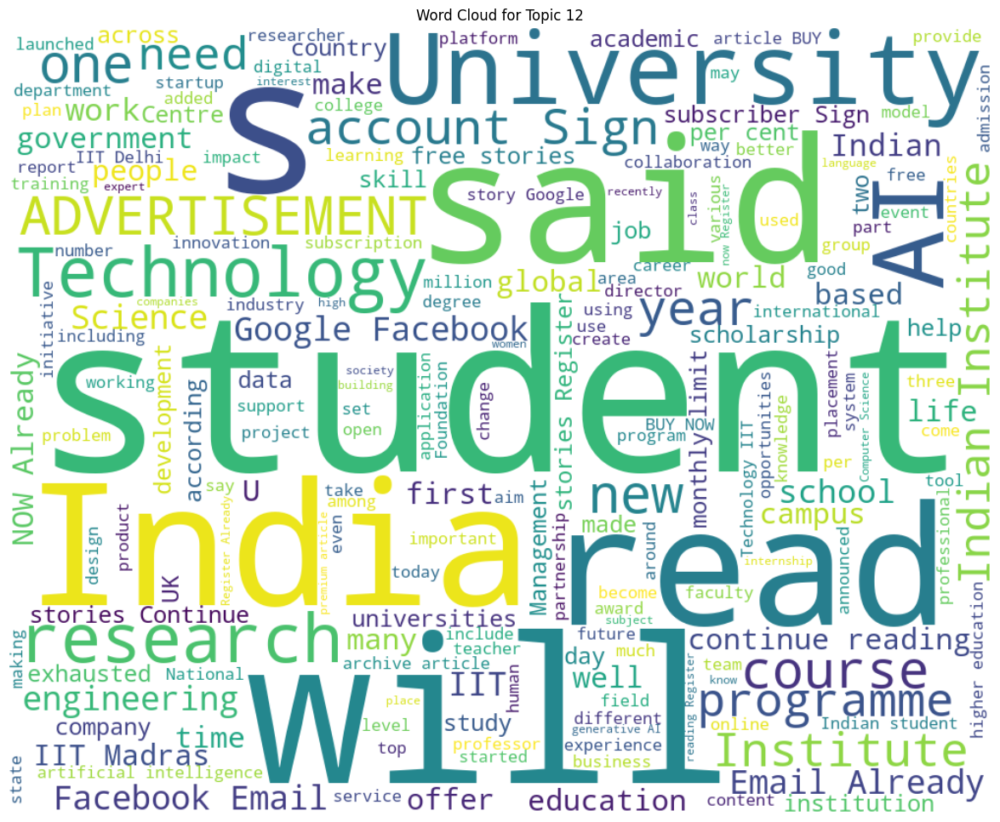

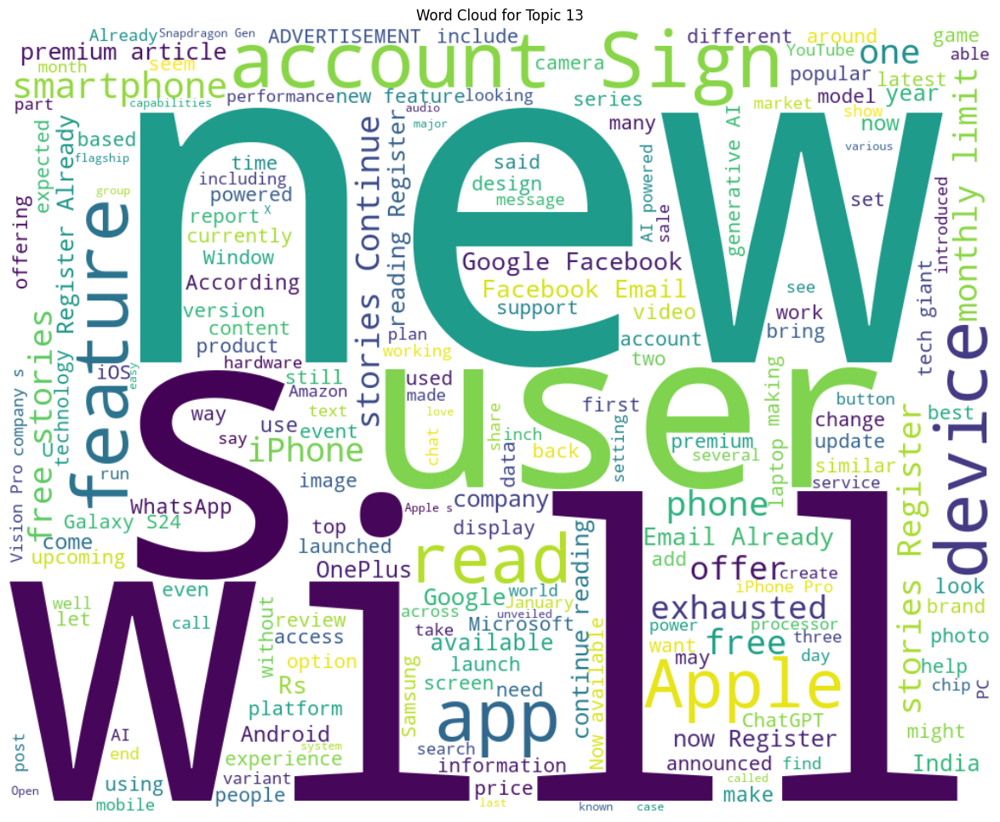

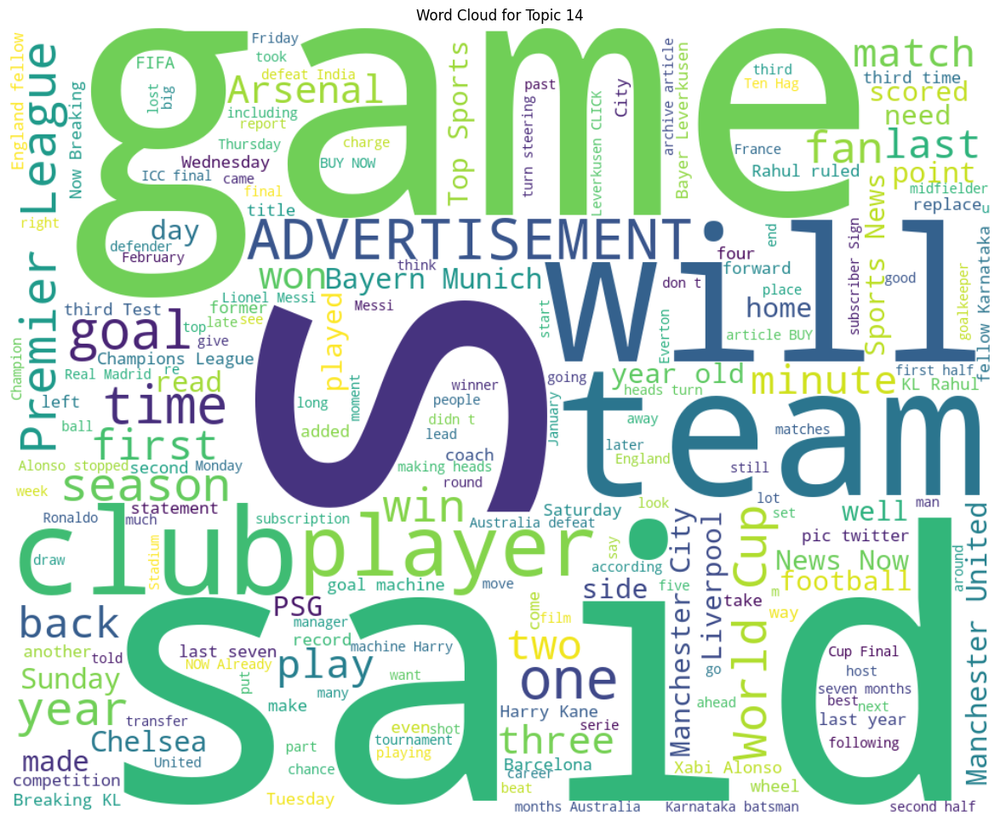

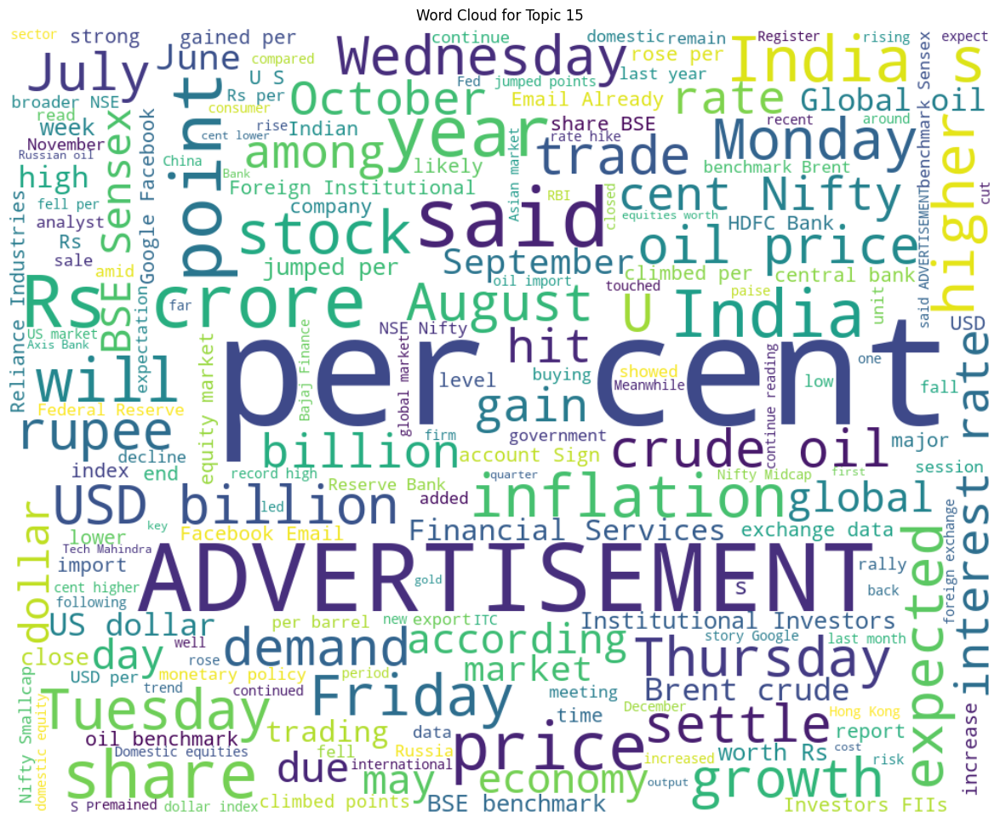

In [11]:
num_topics = df['topic'].nunique()
for topic_num in range(1, num_topics + 1):
    topic_articles = df[df['topic'] == topic_num]['content']
    text_for_wordcloud = ' '.join(topic_articles)
    
    wordcloud = WordCloud(width=1000, height=800, background_color='white').generate(text_for_wordcloud)
    
    plt.figure(figsize=(24, 12))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Topic {topic_num}')
    plt.show()